# 📊 01 — Khám phá dữ liệu thô (Raw Data Exploration)

Notebook này thực hiện:
1. **Tải dữ liệu** từ Kaggle (RDD-2022 & BharatPotHole)
2. **Khám phá cấu trúc thư mục** của từng dataset
3. **Phân tích thống kê** về ảnh và nhãn
4. **Hiển thị ảnh mẫu** với bounding boxes

---

## 0. Cài đặt thư viện cần thiết

In [ ]:
!pip install kaggle matplotlib opencv-python-headless Pillow pandas seaborn tqdm

In [41]:
import os
import sys
import glob
import random
from pathlib import Path
from collections import Counter, defaultdict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
from PIL import Image
from tqdm.notebook import tqdm

# Cấu hình hiển thị
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['font.size'] = 12
sns.set_style('whitegrid')

# Đường dẫn gốc
import os
# Tự động xác định PROJECT_ROOT
PROJECT_ROOT = Path(os.getcwd())
if PROJECT_ROOT.name == 'notebooks':
    PROJECT_ROOT = PROJECT_ROOT.parent
RAW_DATA_DIR = PROJECT_ROOT / 'data' / 'raw'
RAW_DATA_DIR.mkdir(parents=True, exist_ok=True)

print(f"📁 Project root: {PROJECT_ROOT}")
print(f"📁 Raw data dir: {RAW_DATA_DIR}")

📁 Project root: d:\Research\Yolo_Pothole_detection\Pothole_Detection
📁 Raw data dir: d:\Research\Yolo_Pothole_detection\Pothole_Detection\data\raw


---
## 1. 📥 Tải dữ liệu từ Kaggle

**Yêu cầu trước khi chạy:**
- Đã cài `kaggle` CLI: `pip install kaggle`
- Đã đặt file `kaggle.json` vào `~/.kaggle/kaggle.json`
  - Lấy API key tại: https://www.kaggle.com/settings → Create New Token

### Dataset 1: RDD-2022 (Road Damage Detection 2022)
- **Nguồn:** https://www.kaggle.com/datasets/aliabdelmenam/rdd-2022
- **Kích thước:** ~10 GB
- **Nội dung:** ~38,000 ảnh đường bộ, annotation YOLO format
- **Classes:** `['longitudinal crack', 'transverse crack', 'alligator crack', 'other corruption', 'Pothole']`

### Dataset 2: BharatPotHole
- **Nguồn:** https://www.kaggle.com/datasets/surbhisaswatimohanty/bharatpothole
- **Kích thước:** ~765 MB
- **Nội dung:** Ảnh ổ gà từ đường phố Ấn Độ

⚠️ **Lưu ý:** RDD-2022 rất lớn (~10 GB), có thể mất vài giờ để tải. Bạn có thể chạy từng cell riêng.

In [ ]:
# ====================================================================
# 📥 CELL TẢI DATASET 1: RDD-2022 (~10 GB) — CÓ THỂ MẤT VÀI GIỜ!
# ====================================================================

!python -m kaggle datasets download -d aliabdelmenam/rdd-2022 \
    -p "{RAW_DATA_DIR / 'rdd2022'}" --unzip

print(f"   Dữ liệu sẽ lưu tại: {RAW_DATA_DIR / 'rdd2022'}")

In [ ]:
# ====================================================================
# 📥 CELL TẢI DATASET 2: BharatPotHole (~765 MB) — ~15 phút
# ====================================================================
# Bỏ comment dòng dưới để tải:

!python -m kaggle datasets download -d surbhisaswatimohanty/bharatpothole \ -p "{RAW_DATA_DIR / 'bharatpothole'}" --unzip

print(f"   Dữ liệu sẽ lưu tại: {RAW_DATA_DIR / 'bharatpothole'}")

---
## 2. 🗂️ Khám phá cấu trúc thư mục

Sau khi tải xong, hãy kiểm tra cấu trúc thư mục của từng dataset.

In [42]:
def print_tree(directory, prefix='', max_depth=3, current_depth=0, max_files=10):
    """In cấu trúc thư mục dạng cây."""
    directory = Path(directory)
    if not directory.exists():
        print(f"❌ Thư mục không tồn tại: {directory}")
        return
    
    if current_depth >= max_depth:
        return
    
    items = sorted(directory.iterdir())
    dirs = [i for i in items if i.is_dir()]
    files = [i for i in items if i.is_file()]
    
    # In thư mục con
    for d in dirs:
        n_children = len(list(d.rglob('*')))
        print(f"{prefix}📁 {d.name}/ ({n_children} items)")
        print_tree(d, prefix + '   ', max_depth, current_depth + 1, max_files)
    
    # In file (giới hạn)
    if files:
        shown = files[:max_files]
        for f in shown:
            size_mb = f.stat().st_size / (1024 * 1024)
            print(f"{prefix}📄 {f.name} ({size_mb:.2f} MB)")
        if len(files) > max_files:
            print(f"{prefix}   ... và {len(files) - max_files} file khác")

In [43]:
print("=" * 60)
print("🛣️  CẤU TRÚC DATASET RDD-2022")
print("=" * 60)
rdd_dir = RAW_DATA_DIR / 'rdd2022'
if rdd_dir.exists():
    print_tree(rdd_dir, max_depth=3, max_files=5)
else:
    print(f"⚠️ Chưa tải RDD-2022. Chạy cell tải ở phần 1.")

🛣️  CẤU TRÚC DATASET RDD-2022
📁 RDD_SPLIT/ (76779 items)
   📁 test/ (11518 items)
      📁 images/ (5758 items)
      📁 labels/ (5758 items)
   📁 train/ (53740 items)
      📁 images/ (26869 items)
      📁 labels/ (26869 items)
   📁 val/ (11518 items)
      📁 images/ (5758 items)
      📁 labels/ (5758 items)


In [44]:
print("=" * 60)
print("🕳️  CẤU TRÚC DATASET BHARATPOTHOLE")
print("=" * 60)
bharat_dir = RAW_DATA_DIR / 'bharatpothole'
if bharat_dir.exists():
    print_tree(bharat_dir, max_depth=3, max_files=5)
else:
    print(f"⚠️ Chưa tải BharatPotHole. Chạy cell tải ở phần 1.")

🕳️  CẤU TRÚC DATASET BHARATPOTHOLE
📁 BharatPotHole/ (14163 items)
   📁 BharatPotHole/ (14162 items)
      📁 test/ (1326 items)
      📁 train/ (10137 items)
      📁 valid/ (2693 items)
      📄 data.yaml (0.00 MB)
      📄 README.dataset.txt (0.00 MB)
      📄 README.roboflow.txt (0.00 MB)


---
## 3. 🔍 Hàm tiện ích cho khám phá dữ liệu

In [45]:
import os
# Tự động xác định PROJECT_ROOT
PROJECT_ROOT = Path(os.getcwd())
if PROJECT_ROOT.name == 'notebooks':
    PROJECT_ROOT = PROJECT_ROOT.parent


---
## 4. 🛣️ Khám phá Dataset 1: RDD-2022

In [46]:
# ====================================================================
#  Thông tin tổng quan RDD-2022
# ====================================================================

ensure_rdd_stats()
RDD_DIR = RAW_DATA_DIR / 'rdd2022' / 'RDD_SPLIT'

# Class names theo mô tả dataset
RDD_CLASS_NAMES = [
    'Longitudinal Crack',   # 0
    'Transverse Crack',     # 1
    'Alligator Crack',      # 2
    'Other Corruption',     # 3
    'Pothole'               # 4
]

if not RDD_DIR.exists():
    print("⚠️ RDD-2022 chưa được tải. Vui lòng chạy cell tải ở phần 1.")
    print("   Các cell bên dưới sẽ bỏ qua dataset này.")
else:
    print(f"✅ Tìm thấy RDD-2022 tại: {RDD_DIR}")

✅ Tìm thấy RDD-2022 tại: d:\Research\Yolo_Pothole_detection\Pothole_Detection\data\raw\rdd2022\RDD_SPLIT


In [47]:
# ====================================================================
#  Đếm số ảnh và nhãn theo từng split (train/val/test)
# ====================================================================

ensure_rdd_stats()
if RDD_DIR.exists():
    rdd_stats = {}
    
    for split in ['train', 'val', 'test']:
        img_dir = RDD_DIR / split / 'images'
        lbl_dir = RDD_DIR / split / 'labels'
        
        if img_dir.exists():
            imgs = find_images(img_dir)
            lbls = find_labels(lbl_dir) if lbl_dir.exists() else []
            rdd_stats[split] = {
                'n_images': len(imgs),
                'n_labels': len(lbls),
                'images': imgs,
                'labels': lbls
            }
            print(f"📊 {split.upper():>5s}: {len(imgs):>6,} ảnh | {len(lbls):>6,} nhãn")
        else:
            # Thử tìm cấu trúc khác
            imgs = find_images(RDD_DIR / split) if (RDD_DIR / split).exists() else []
            lbls = find_labels(RDD_DIR / split) if (RDD_DIR / split).exists() else []
            rdd_stats[split] = {
                'n_images': len(imgs),
                'n_labels': len(lbls),
                'images': imgs,
                'labels': lbls
            }
            if imgs:
                print(f"📊 {split.upper():>5s}: {len(imgs):>6,} ảnh | {len(lbls):>6,} nhãn")
    
    # Nếu không có split, tìm toàn bộ
    if all(v['n_images'] == 0 for v in rdd_stats.values()):
        all_imgs = find_images(RDD_DIR)
        all_lbls = find_labels(RDD_DIR)
        print(f"\n📊 TỔNG (không chia split): {len(all_imgs):,} ảnh | {len(all_lbls):,} nhãn")
        rdd_stats['all'] = {
            'n_images': len(all_imgs),
            'n_labels': len(all_lbls),
            'images': all_imgs,
            'labels': all_lbls
        }
    
    total_imgs = sum(v['n_images'] for v in rdd_stats.values())
    total_lbls = sum(v['n_labels'] for v in rdd_stats.values())
    print(f"\n{'─' * 40}")
    print(f"📊 TỔNG: {total_imgs:>6,} ảnh | {total_lbls:>6,} nhãn")
else:
    print("⏭️ Bỏ qua — RDD-2022 chưa tải.")

📊 TRAIN: 26,869 ảnh | 26,869 nhãn
📊   VAL:  5,758 ảnh |  5,758 nhãn
📊  TEST:  5,758 ảnh |  5,758 nhãn

────────────────────────────────────────
📊 TỔNG: 38,385 ảnh | 38,385 nhãn


In [48]:
# ====================================================================
#  Phân tích kích thước ảnh RDD-2022
# ====================================================================

ensure_rdd_stats()
if RDD_DIR.exists():
    # Lấy mẫu để phân tích (tránh quá chậm nếu dataset lớn)
    all_rdd_images = []
    for split_data in rdd_stats.values():
        all_rdd_images.extend(split_data['images'])
    
    sample_size = min(2000, len(all_rdd_images))
    sample_imgs = random.sample(all_rdd_images, sample_size)
    
    print(f"🔍 Phân tích {sample_size} ảnh mẫu từ RDD-2022...")
    img_infos = []
    for img_path in tqdm(sample_imgs, desc="Đọc thông tin ảnh"):
        info = get_image_info(img_path)
        if 'error' not in info:
            img_infos.append(info)
    
    df_rdd_imgs = pd.DataFrame(img_infos)
    
    print(f"\n📐 Thống kê kích thước ảnh RDD-2022:")
    print(df_rdd_imgs[['width', 'height', 'size_kb']].describe().round(1))
    
    print(f"\n🎨 Phân bố format ảnh:")
    print(df_rdd_imgs['format'].value_counts())
    
    print(f"\n📷 Phân bố mode ảnh:")
    print(df_rdd_imgs['mode'].value_counts())
    
    print(f"\n📏 Kích thước phổ biến nhất:")
    size_counts = df_rdd_imgs.groupby(['width', 'height']).size().sort_values(ascending=False)
    print(size_counts.head(10))
else:
    print("⏭️ Bỏ qua — RDD-2022 chưa tải.")

🔍 Phân tích 2000 ảnh mẫu từ RDD-2022...


Đọc thông tin ảnh:   0%|          | 0/2000 [00:00<?, ?it/s]


📐 Thống kê kích thước ảnh RDD-2022:
        width  height  size_kb
count  2000.0  2000.0   2000.0
mean   1286.2   915.4    274.0
std    1305.5   572.8    422.7
min     512.0   512.0     18.1
25%     600.0   600.0     63.2
50%     640.0   640.0     76.6
75%     720.0   720.0     97.1
max    4040.0  2044.0   2223.4

🎨 Phân bố format ảnh:
format
JPEG    2000
Name: count, dtype: int64

📷 Phân bố mode ảnh:
mode
RGB    2000
Name: count, dtype: int64

📏 Kích thước phổ biến nhất:
width  height
600    600       691
720    720       413
640    640       263
512    512       214
4040   2035      214
3643   2041      155
3650   2044       40
540    540         6
1024   1024        3
1080   1080        1
dtype: int64


C:\Users\Admin\AppData\Local\Temp\ipykernel_29052\2113734199.py:30: UserWarning: Glyph 128208 (\N{TRIANGULAR RULER}) missing from font(s) Arial.
  plt.tight_layout()
D:\Research\Yolo_Pothole_detection\Pothole_Detection\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128208 (\N{TRIANGULAR RULER}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


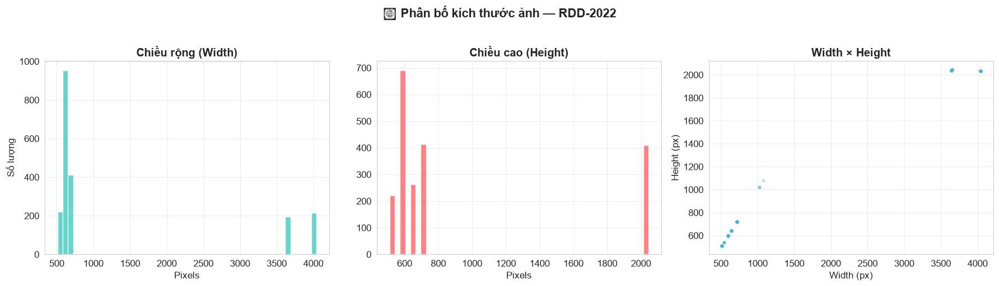

In [49]:
# ====================================================================
#  Biểu đồ phân bố kích thước ảnh RDD-2022
# ====================================================================

ensure_rdd_stats()
if RDD_DIR.exists() and 'df_rdd_imgs' in dir() and len(df_rdd_imgs) > 0:
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle('📐 Phân bố kích thước ảnh — RDD-2022', fontsize=16, fontweight='bold', y=1.02)
    
    # Width distribution
    axes[0].hist(df_rdd_imgs['width'], bins=50, color='#4ECDC4', edgecolor='white', alpha=0.85)
    axes[0].set_title('Chiều rộng (Width)', fontweight='bold')
    axes[0].set_xlabel('Pixels')
    axes[0].set_ylabel('Số lượng')
    
    # Height distribution
    axes[1].hist(df_rdd_imgs['height'], bins=50, color='#FF6B6B', edgecolor='white', alpha=0.85)
    axes[1].set_title('Chiều cao (Height)', fontweight='bold')
    axes[1].set_xlabel('Pixels')
    
    # Scatter width vs height
    axes[2].scatter(
        df_rdd_imgs['width'], df_rdd_imgs['height'],
        alpha=0.3, s=10, color='#45B7D1'
    )
    axes[2].set_title('Width × Height', fontweight='bold')
    axes[2].set_xlabel('Width (px)')
    axes[2].set_ylabel('Height (px)')
    
    plt.tight_layout()
    plt.show()
else:
    print("⏭️ Bỏ qua — RDD-2022 chưa tải hoặc chưa phân tích.")

In [50]:
# ====================================================================
#  Phân bố class trong nhãn RDD-2022
# ====================================================================

ensure_rdd_stats()
if RDD_DIR.exists():
    all_rdd_labels = []
    for split_data in rdd_stats.values():
        all_rdd_labels.extend(split_data['labels'])
    
    class_counter = Counter()
    boxes_per_image = []
    empty_labels = 0
    
    for lbl_path in tqdm(all_rdd_labels, desc="Đọc nhãn RDD-2022"):
        boxes = parse_yolo_label(lbl_path)
        boxes_per_image.append(len(boxes))
        if len(boxes) == 0:
            empty_labels += 1
        for box in boxes:
            class_counter[box['class_id']] += 1
    
    print(f"\n📊 Phân bố class trong RDD-2022:")
    print(f"{'─' * 50}")
    total_boxes = sum(class_counter.values())
    for cls_id in sorted(class_counter.keys()):
        name = RDD_CLASS_NAMES[cls_id] if cls_id < len(RDD_CLASS_NAMES) else f'Class {cls_id}'
        count = class_counter[cls_id]
        pct = count / total_boxes * 100
        bar = '█' * int(pct / 2)
        print(f"  {cls_id} | {name:<22s} | {count:>7,} ({pct:>5.1f}%) {bar}")
    
    print(f"{'─' * 50}")
    print(f"  TỔNG bounding boxes: {total_boxes:,}")
    print(f"  File nhãn rỗng: {empty_labels:,}")
    print(f"  Trung bình boxes/ảnh: {np.mean(boxes_per_image):.1f}")
    print(f"  Max boxes/ảnh: {max(boxes_per_image) if boxes_per_image else 0}")
else:
    print("⏭️ Bỏ qua — RDD-2022 chưa tải.")

Đọc nhãn RDD-2022:   0%|          | 0/38385 [00:00<?, ?it/s]


📊 Phân bố class trong RDD-2022:
──────────────────────────────────────────────────
  0 | Longitudinal Crack     |  26,016 ( 39.6%) ███████████████████
  1 | Transverse Crack       |  11,830 ( 18.0%) █████████
  2 | Alligator Crack        |  10,617 ( 16.2%) ████████
  3 | Other Corruption       |  10,705 ( 16.3%) ████████
  4 | Pothole                |   6,544 ( 10.0%) ████
──────────────────────────────────────────────────
  TỔNG bounding boxes: 65,712
  File nhãn rỗng: 11,724
  Trung bình boxes/ảnh: 1.7
  Max boxes/ảnh: 44


C:\Users\Admin\AppData\Local\Temp\ipykernel_29052\4124054428.py:32: UserWarning: Glyph 127991 (\N{LABEL}) missing from font(s) Arial.
  plt.tight_layout()
D:\Research\Yolo_Pothole_detection\Pothole_Detection\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 127991 (\N{LABEL}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


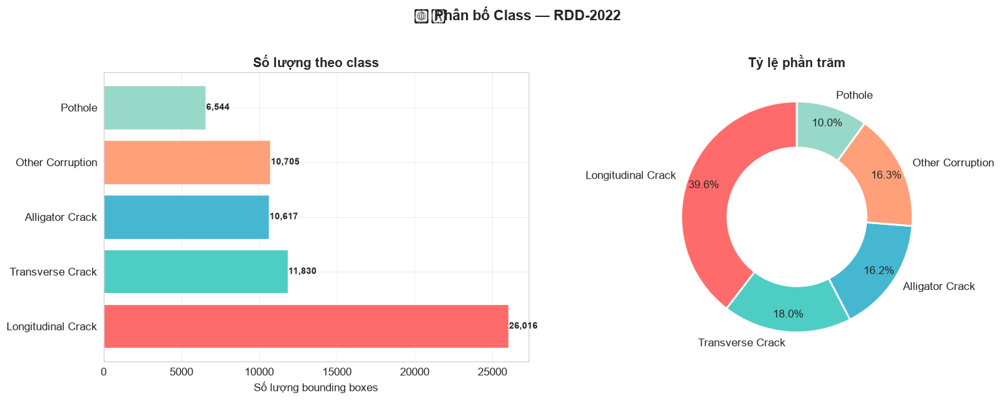

In [51]:
# ====================================================================
#  Biểu đồ phân bố class RDD-2022
# ====================================================================

ensure_rdd_stats()
if RDD_DIR.exists() and 'class_counter' in dir() and len(class_counter) > 0:
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle('🏷️ Phân bố Class — RDD-2022', fontsize=16, fontweight='bold', y=1.02)
    
    # Bar chart
    class_ids = sorted(class_counter.keys())
    names = [RDD_CLASS_NAMES[i] if i < len(RDD_CLASS_NAMES) else f'Class {i}' for i in class_ids]
    counts = [class_counter[i] for i in class_ids]
    colors_bar = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA07A', '#98D8C8', '#F7DC6F', '#BB8FCE', '#85C1E9']
    
    bars = axes[0].barh(names, counts, color=colors_bar[:len(names)], edgecolor='white')
    axes[0].set_xlabel('Số lượng bounding boxes')
    axes[0].set_title('Số lượng theo class', fontweight='bold')
    for bar, count in zip(bars, counts):
        axes[0].text(bar.get_width() + 50, bar.get_y() + bar.get_height()/2,
                     f'{count:,}', va='center', fontsize=10, fontweight='bold')
    
    # Pie chart
    axes[1].pie(
        counts, labels=names, autopct='%1.1f%%',
        colors=colors_bar[:len(names)],
        pctdistance=0.85, startangle=90,
        wedgeprops=dict(width=0.4, edgecolor='white', linewidth=2)
    )
    axes[1].set_title('Tỷ lệ phần trăm', fontweight='bold')
    
    plt.tight_layout()
    plt.show()
else:
    print("⏭️ Bỏ qua — RDD-2022 chưa tải hoặc chưa phân tích.")

C:\Users\Admin\AppData\Local\Temp\ipykernel_29052\3343388029.py:55: UserWarning: Glyph 128739 (\N{MOTORWAY}) missing from font(s) Arial.
  plt.tight_layout()
D:\Research\Yolo_Pothole_detection\Pothole_Detection\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128739 (\N{MOTORWAY}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


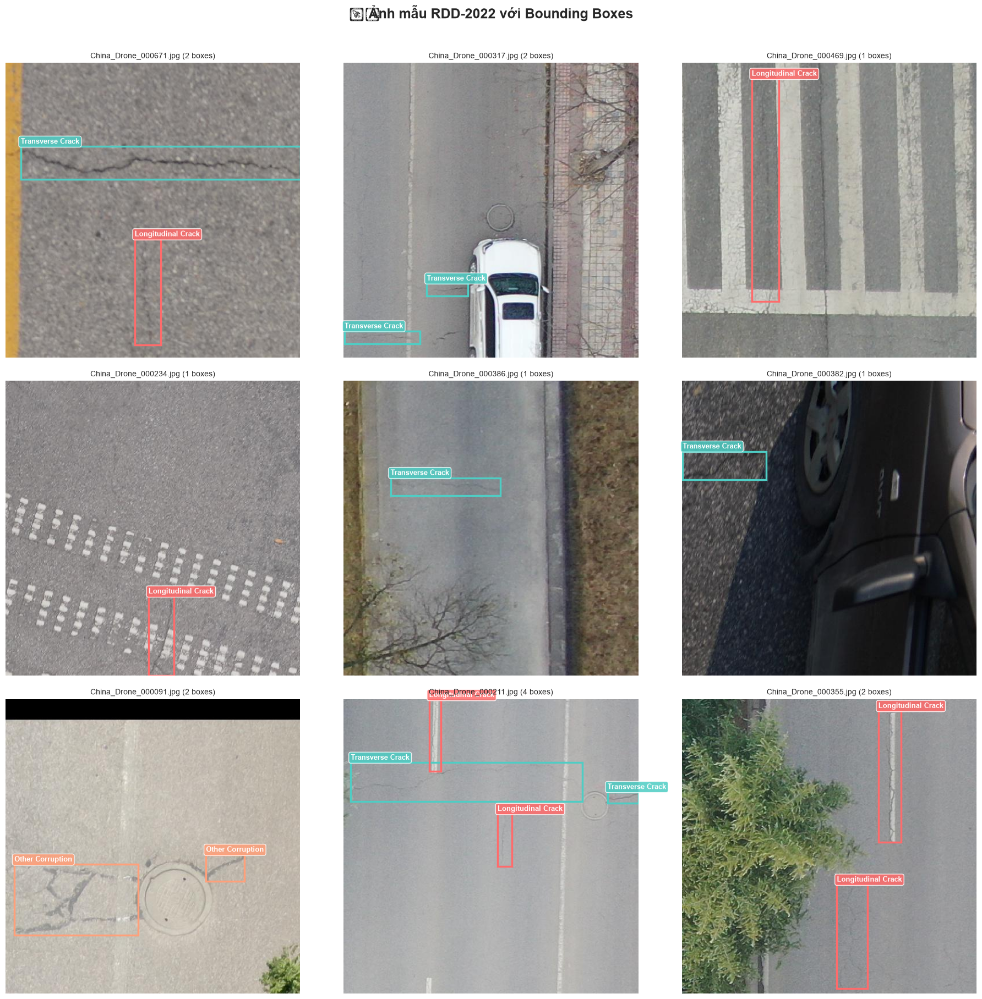

In [52]:
# ====================================================================
#  Hiển thị ảnh mẫu RDD-2022 với bounding boxes
# ====================================================================

ensure_rdd_stats()
if RDD_DIR.exists():
    # Tìm ảnh có nhãn tương ứng
    sample_split = 'train' if 'train' in rdd_stats and rdd_stats['train']['n_labels'] > 0 else \
                   (list(rdd_stats.keys())[0] if rdd_stats else None)
    
    if sample_split and rdd_stats[sample_split]['n_labels'] > 0:
        labels = rdd_stats[sample_split]['labels']
        
        # Lọc nhãn có ít nhất 1 box
        non_empty_labels = []
        for lbl in labels[:500]:  # Kiểm tra 500 nhãn đầu
            boxes = parse_yolo_label(lbl)
            if len(boxes) > 0:
                non_empty_labels.append(lbl)
        
        if non_empty_labels:
            # Chọn 9 ảnh ngẫu nhiên
            sample_labels = random.sample(non_empty_labels, min(9, len(non_empty_labels)))
            
            fig, axes = plt.subplots(3, 3, figsize=(18, 18))
            fig.suptitle('🛣️ Ảnh mẫu RDD-2022 với Bounding Boxes', fontsize=18, fontweight='bold', y=1.01)
            
            for idx, lbl_path in enumerate(sample_labels):
                ax = axes[idx // 3][idx % 3]
                
                # Tìm ảnh tương ứng
                img_name = lbl_path.stem  # Tên file không có extension
                img_dir = lbl_path.parent.parent / 'images'
                
                img_path = None
                for ext in IMAGE_EXTS:
                    candidate = img_dir / f"{img_name}{ext}"
                    if candidate.exists():
                        img_path = candidate
                        break
                    candidate = img_dir / f"{img_name}{ext.upper()}"
                    if candidate.exists():
                        img_path = candidate
                        break
                
                if img_path:
                    draw_yolo_boxes(img_path, lbl_path, RDD_CLASS_NAMES, ax=ax)
                    boxes = parse_yolo_label(lbl_path)
                    ax.set_title(f"{img_path.name} ({len(boxes)} boxes)", fontsize=10)
                else:
                    ax.text(0.5, 0.5, f'Không tìm thấy ảnh\n{img_name}',
                            ha='center', va='center', transform=ax.transAxes)
                    ax.set_axis_off()
            
            plt.tight_layout()
            plt.show()
        else:
            print("⚠️ Không tìm thấy nhãn có bounding box.")
    else:
        print("⚠️ Không tìm thấy split có nhãn.")
else:
    print("⏭️ Bỏ qua — RDD-2022 chưa tải.")

C:\Users\Admin\AppData\Local\Temp\ipykernel_29052\3437327574.py:56: UserWarning: Glyph 127991 (\N{LABEL}) missing from font(s) Arial.
  plt.tight_layout()


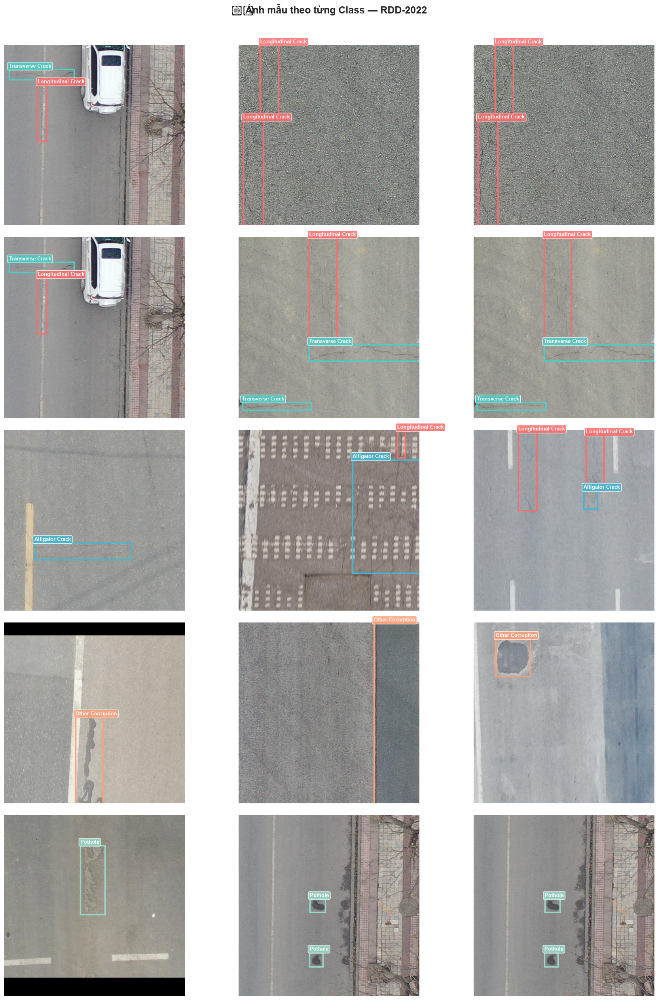

In [53]:
# ====================================================================
#  Hiển thị ảnh mẫu theo TỪNG CLASS — RDD-2022
# ====================================================================

ensure_rdd_stats()
if RDD_DIR.exists() and 'rdd_stats' in dir():
    # Thu thập ảnh theo class
    class_to_samples = defaultdict(list)  # class_id -> [(img_path, lbl_path)]
    
    sample_split = 'train' if 'train' in rdd_stats and rdd_stats['train']['n_labels'] > 0 else \
                   (list(rdd_stats.keys())[0] if rdd_stats else None)
    
    if sample_split:
        for lbl_path in rdd_stats[sample_split]['labels'][:1000]:
            boxes = parse_yolo_label(lbl_path)
            for box in boxes:
                cls_id = box['class_id']
                if len(class_to_samples[cls_id]) < 3:  # Chỉ cần 3 ảnh/class
                    img_name = lbl_path.stem
                    img_dir = lbl_path.parent.parent / 'images'
                    for ext in IMAGE_EXTS:
                        candidate = img_dir / f"{img_name}{ext}"
                        if candidate.exists():
                            class_to_samples[cls_id].append((candidate, lbl_path))
                            break
                        candidate = img_dir / f"{img_name}{ext.upper()}"
                        if candidate.exists():
                            class_to_samples[cls_id].append((candidate, lbl_path))
                            break
        
        n_classes = len(class_to_samples)
        if n_classes > 0:
            fig, axes = plt.subplots(n_classes, 3, figsize=(18, 5 * n_classes))
            fig.suptitle('🏷️ Ảnh mẫu theo từng Class — RDD-2022',
                         fontsize=18, fontweight='bold', y=1.01)
            
            if n_classes == 1:
                axes = [axes]
            
            for row_idx, cls_id in enumerate(sorted(class_to_samples.keys())):
                samples = class_to_samples[cls_id]
                cls_name = RDD_CLASS_NAMES[cls_id] if cls_id < len(RDD_CLASS_NAMES) else f'Class {cls_id}'
                
                for col_idx in range(3):
                    ax = axes[row_idx][col_idx] if n_classes > 1 else axes[col_idx]
                    if col_idx < len(samples):
                        img_path, lbl_path = samples[col_idx]
                        draw_yolo_boxes(img_path, lbl_path, RDD_CLASS_NAMES, ax=ax)
                    else:
                        ax.set_axis_off()
                    
                    if col_idx == 0:
                        ax.set_ylabel(f"{cls_name}", fontsize=13, fontweight='bold',
                                      rotation=0, labelpad=120, va='center')
            
            plt.tight_layout()
            plt.show()
        else:
            print("⚠️ Không tìm thấy ảnh mẫu theo class.")
else:
    print("⏭️ Bỏ qua — RDD-2022 chưa tải.")

---
## 5. 🕳️ Khám phá Dataset 2: BharatPotHole

In [54]:
# ====================================================================
#  Thông tin tổng quan BharatPotHole
# ====================================================================

BHARAT_DIR = RAW_DATA_DIR / 'bharatpothole' / 'BharatPotHole' / 'BharatPotHole'

if not BHARAT_DIR.exists():
    print("⚠️ BharatPotHole chưa được tải. Vui lòng chạy cell tải ở phần 1.")
else:
    print(f"✅ Tìm thấy BharatPotHole tại: {BHARAT_DIR}")
    print(f"\n📁 Cấu trúc:")
    print_tree(BHARAT_DIR, max_depth=3, max_files=5)

✅ Tìm thấy BharatPotHole tại: d:\Research\Yolo_Pothole_detection\Pothole_Detection\data\raw\bharatpothole\BharatPotHole\BharatPotHole

📁 Cấu trúc:
📁 test/ (1326 items)
   📁 images/ (662 items)
      📄 20250501091922_0060_frame_00021_jpg.rf.5b0c19144874e900e7127b3da0cd04c4.jpg (0.22 MB)
      📄 20250501091922_0060_frame_00040_jpg.rf.1abcc8ff2712d8f906ef07c5b3cfbfaa.jpg (0.16 MB)
      📄 20250501091922_0060_frame_00052_jpg.rf.29d1a6ab35a65b7a45cbf0202e2d2a40.jpg (0.11 MB)
      📄 20250501091922_0060_frame_00064_jpg.rf.eed54ae511eed0c22cf1c40735d93b31.jpg (0.11 MB)
      📄 20250501091922_0060_frame_00070_jpg.rf.4b05c993a310013aa848c81e2ada96f6.jpg (0.12 MB)
         ... và 657 file khác
   📁 labels/ (662 items)
      📄 20250501091922_0060_frame_00021_jpg.rf.5b0c19144874e900e7127b3da0cd04c4.txt (0.00 MB)
      📄 20250501091922_0060_frame_00040_jpg.rf.1abcc8ff2712d8f906ef07c5b3cfbfaa.txt (0.00 MB)
      📄 20250501091922_0060_frame_00052_jpg.rf.29d1a6ab35a65b7a45cbf0202e2d2a40.txt (0.00 MB)


In [55]:
# ====================================================================
#  Tự động phát hiện cấu trúc BharatPotHole
# ====================================================================

ensure_bharat_data()
if BHARAT_DIR.exists():
    # Tìm tất cả ảnh
    bharat_images = find_images(BHARAT_DIR)
    bharat_labels = find_labels(BHARAT_DIR)
    
    print(f"📊 Tổng quan BharatPotHole:")
    print(f"   Tổng số ảnh: {len(bharat_images):,}")
    print(f"   Tổng số nhãn (.txt): {len(bharat_labels):,}")
    
    # Phân tích cấu trúc thư mục
    if bharat_images:
        parent_dirs = Counter([str(p.parent.relative_to(BHARAT_DIR)) for p in bharat_images])
        print(f"\n📂 Ảnh phân bố theo thư mục:")
        for dir_name, count in parent_dirs.most_common(20):
            print(f"   {dir_name}: {count:,} ảnh")
    
    if bharat_labels:
        lbl_parent_dirs = Counter([str(p.parent.relative_to(BHARAT_DIR)) for p in bharat_labels])
        print(f"\n📂 Nhãn phân bố theo thư mục:")
        for dir_name, count in lbl_parent_dirs.most_common(20):
            print(f"   {dir_name}: {count:,} nhãn")
    
    # Kiểm tra xem có file YAML/config không
    yaml_files = list(BHARAT_DIR.rglob('*.yaml')) + list(BHARAT_DIR.rglob('*.yml'))
    if yaml_files:
        print(f"\n⚙️ Tìm thấy file config:")
        for yf in yaml_files:
            print(f"   {yf}")
            with open(yf, 'r', encoding='utf-8', errors='ignore') as f:
                print(f"   Nội dung:\n{f.read()[:500]}")
    
    # Kiểm tra CSV files
    csv_files = list(BHARAT_DIR.rglob('*.csv'))
    if csv_files:
        print(f"\n📋 Tìm thấy file CSV:")
        for cf in csv_files:
            print(f"   {cf}")
            df_temp = pd.read_csv(cf, nrows=5)
            print(f"   Columns: {list(df_temp.columns)}")
            print(f"   Shape: {pd.read_csv(cf).shape}")
            display(df_temp)
else:
    print("⏭️ Bỏ qua — BharatPotHole chưa tải.")

📊 Tổng quan BharatPotHole:
   Tổng số ảnh: 7,074
   Tổng số nhãn (.txt): 7,076

📂 Ảnh phân bố theo thư mục:
   train\images: 5,067 ảnh
   valid\images: 1,345 ảnh
   test\images: 662 ảnh

📂 Nhãn phân bố theo thư mục:
   train\labels: 5,067 nhãn
   valid\labels: 1,345 nhãn
   test\labels: 662 nhãn
   .: 2 nhãn

⚙️ Tìm thấy file config:
   d:\Research\Yolo_Pothole_detection\Pothole_Detection\data\raw\bharatpothole\BharatPotHole\BharatPotHole\data.yaml
   Nội dung:
train: ../train/images
val: ../valid/images
test: ../test/images

nc: 1
names: ['pothole']

roboflow:
  workspace: yolo-ewrwa
  project: dashcam-mg6en
  version: 14
  license: CC BY 4.0
  url: https://universe.roboflow.com/yolo-ewrwa/dashcam-mg6en/dataset/14


In [56]:
# ====================================================================
#  Phân tích kích thước ảnh BharatPotHole
# ====================================================================

ensure_bharat_data()
if BHARAT_DIR.exists() and 'bharat_images' in dir() and len(bharat_images) > 0:
    sample_size_b = min(1000, len(bharat_images))
    sample_imgs_b = random.sample(bharat_images, sample_size_b)
    
    print(f"🔍 Phân tích {sample_size_b} ảnh mẫu từ BharatPotHole...")
    img_infos_b = []
    for img_path in tqdm(sample_imgs_b, desc="Đọc thông tin ảnh"):
        info = get_image_info(img_path)
        if 'error' not in info:
            img_infos_b.append(info)
    
    df_bharat_imgs = pd.DataFrame(img_infos_b)
    
    print(f"\n📐 Thống kê kích thước ảnh BharatPotHole:")
    print(df_bharat_imgs[['width', 'height', 'size_kb']].describe().round(1))
    
    print(f"\n🎨 Phân bố format:")
    print(df_bharat_imgs['format'].value_counts())
    
    print(f"\n📷 Phân bố mode:")
    print(df_bharat_imgs['mode'].value_counts())
    
    print(f"\n📏 Kích thước phổ biến nhất:")
    size_counts_b = df_bharat_imgs.groupby(['width', 'height']).size().sort_values(ascending=False)
    print(size_counts_b.head(10))
else:
    print("⏭️ Bỏ qua — BharatPotHole chưa tải.")

🔍 Phân tích 1000 ảnh mẫu từ BharatPotHole...


Đọc thông tin ảnh:   0%|          | 0/1000 [00:00<?, ?it/s]


📐 Thống kê kích thước ảnh BharatPotHole:
        width  height  size_kb
count  1000.0  1000.0   1000.0
mean    640.0   640.0    116.5
std       0.0     0.0     35.1
min     640.0   640.0     34.3
25%     640.0   640.0     89.5
50%     640.0   640.0    116.6
75%     640.0   640.0    138.7
max     640.0   640.0    251.6

🎨 Phân bố format:
format
JPEG    1000
Name: count, dtype: int64

📷 Phân bố mode:
mode
RGB    1000
Name: count, dtype: int64

📏 Kích thước phổ biến nhất:
width  height
640    640       1000
dtype: int64


C:\Users\Admin\AppData\Local\Temp\ipykernel_29052\1041327175.py:30: UserWarning: Glyph 128208 (\N{TRIANGULAR RULER}) missing from font(s) Arial.
  plt.tight_layout()
D:\Research\Yolo_Pothole_detection\Pothole_Detection\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128208 (\N{TRIANGULAR RULER}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


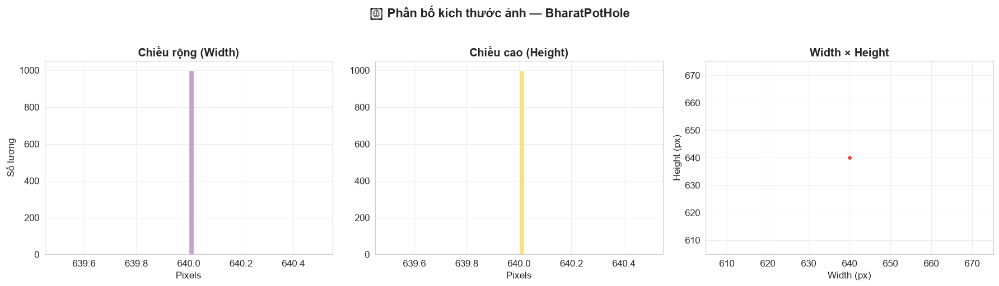

In [57]:
# ====================================================================
#  Biểu đồ phân bố kích thước ảnh BharatPotHole
# ====================================================================

ensure_bharat_data()
if BHARAT_DIR.exists() and 'df_bharat_imgs' in dir() and len(df_bharat_imgs) > 0:
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle('📐 Phân bố kích thước ảnh — BharatPotHole', fontsize=16, fontweight='bold', y=1.02)
    
    # Width distribution
    axes[0].hist(df_bharat_imgs['width'], bins=50, color='#BB8FCE', edgecolor='white', alpha=0.85)
    axes[0].set_title('Chiều rộng (Width)', fontweight='bold')
    axes[0].set_xlabel('Pixels')
    axes[0].set_ylabel('Số lượng')
    
    # Height distribution
    axes[1].hist(df_bharat_imgs['height'], bins=50, color='#F7DC6F', edgecolor='white', alpha=0.85)
    axes[1].set_title('Chiều cao (Height)', fontweight='bold')
    axes[1].set_xlabel('Pixels')
    
    # Scatter width vs height
    axes[2].scatter(
        df_bharat_imgs['width'], df_bharat_imgs['height'],
        alpha=0.3, s=10, color='#E74C3C'
    )
    axes[2].set_title('Width × Height', fontweight='bold')
    axes[2].set_xlabel('Width (px)')
    axes[2].set_ylabel('Height (px)')
    
    plt.tight_layout()
    plt.show()
else:
    print("⏭️ Bỏ qua — BharatPotHole chưa tải hoặc chưa phân tích.")

Đọc nhãn BharatPotHole:   0%|          | 0/7076 [00:00<?, ?it/s]


📊 Phân bố class trong BharatPotHole:
──────────────────────────────────────────────────
  0 | Class 0     |  12,221 (100.0%) ██████████████████████████████████████████████████
──────────────────────────────────────────────────
  TỔNG bounding boxes: 12,221
  File nhãn rỗng: 2,880
  Trung bình boxes/ảnh: 1.7


C:\Users\Admin\AppData\Local\Temp\ipykernel_29052\3833268296.py:49: UserWarning: Glyph 127991 (\N{LABEL}) missing from font(s) Arial.
  plt.tight_layout()
D:\Research\Yolo_Pothole_detection\Pothole_Detection\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 127991 (\N{LABEL}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


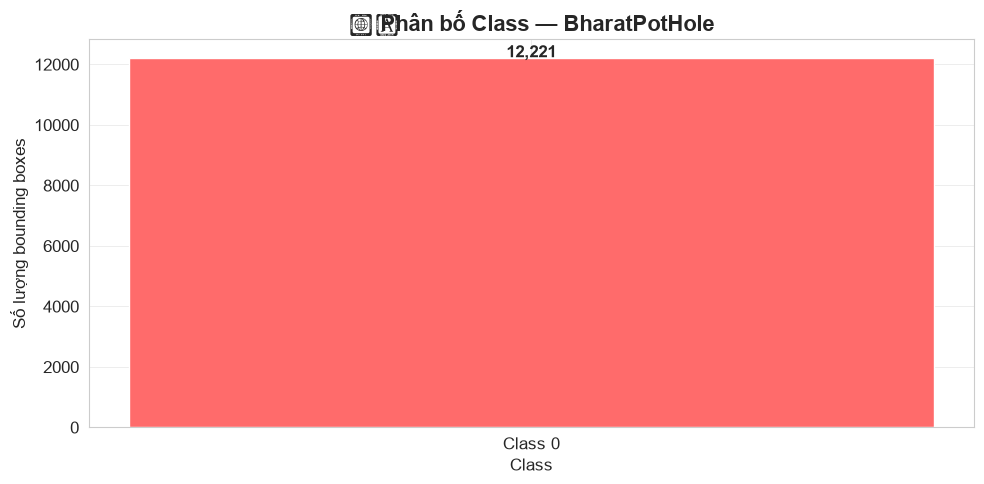

In [58]:
# ====================================================================
#  Phân bố class trong nhãn BharatPotHole
# ====================================================================

ensure_bharat_data()
if BHARAT_DIR.exists() and 'bharat_labels' in dir() and len(bharat_labels) > 0:
    bharat_class_counter = Counter()
    bharat_boxes_per_image = []
    bharat_empty = 0
    
    for lbl_path in tqdm(bharat_labels, desc="Đọc nhãn BharatPotHole"):
        boxes = parse_yolo_label(lbl_path)
        bharat_boxes_per_image.append(len(boxes))
        if len(boxes) == 0:
            bharat_empty += 1
        for box in boxes:
            bharat_class_counter[box['class_id']] += 1
    
    print(f"\n📊 Phân bố class trong BharatPotHole:")
    print(f"{'─' * 50}")
    total_b = sum(bharat_class_counter.values())
    for cls_id in sorted(bharat_class_counter.keys()):
        count = bharat_class_counter[cls_id]
        pct = count / total_b * 100
        bar = '█' * int(pct / 2)
        print(f"  {cls_id} | Class {cls_id:<5} | {count:>7,} ({pct:>5.1f}%) {bar}")
    
    print(f"{'─' * 50}")
    print(f"  TỔNG bounding boxes: {total_b:,}")
    print(f"  File nhãn rỗng: {bharat_empty:,}")
    print(f"  Trung bình boxes/ảnh: {np.mean(bharat_boxes_per_image):.1f}")
    
    # Biểu đồ
    if len(bharat_class_counter) > 0:
        fig, ax = plt.subplots(figsize=(10, 5))
        class_ids_b = sorted(bharat_class_counter.keys())
        counts_b = [bharat_class_counter[i] for i in class_ids_b]
        names_b = [f'Class {i}' for i in class_ids_b]
        
        colors_b = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA07A', '#98D8C8', '#F7DC6F']
        ax.bar(names_b, counts_b, color=colors_b[:len(names_b)], edgecolor='white')
        ax.set_title('🏷️ Phân bố Class — BharatPotHole', fontsize=16, fontweight='bold')
        ax.set_xlabel('Class')
        ax.set_ylabel('Số lượng bounding boxes')
        
        for i, (name, count) in enumerate(zip(names_b, counts_b)):
            ax.text(i, count + 20, f'{count:,}', ha='center', fontweight='bold')
        
        plt.tight_layout()
        plt.show()
elif BHARAT_DIR.exists():
    print("ℹ️ BharatPotHole không có file nhãn YOLO (.txt).")
    print("   Dataset có thể dùng cấu trúc thư mục để phân loại (classification) hoặc format khác.")
else:
    print("⏭️ Bỏ qua — BharatPotHole chưa tải.")

C:\Users\Admin\AppData\Local\Temp\ipykernel_29052\2954509873.py:68: UserWarning: Glyph 128371 (\N{HOLE}) missing from font(s) Arial.
  plt.tight_layout()
D:\Research\Yolo_Pothole_detection\Pothole_Detection\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128371 (\N{HOLE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


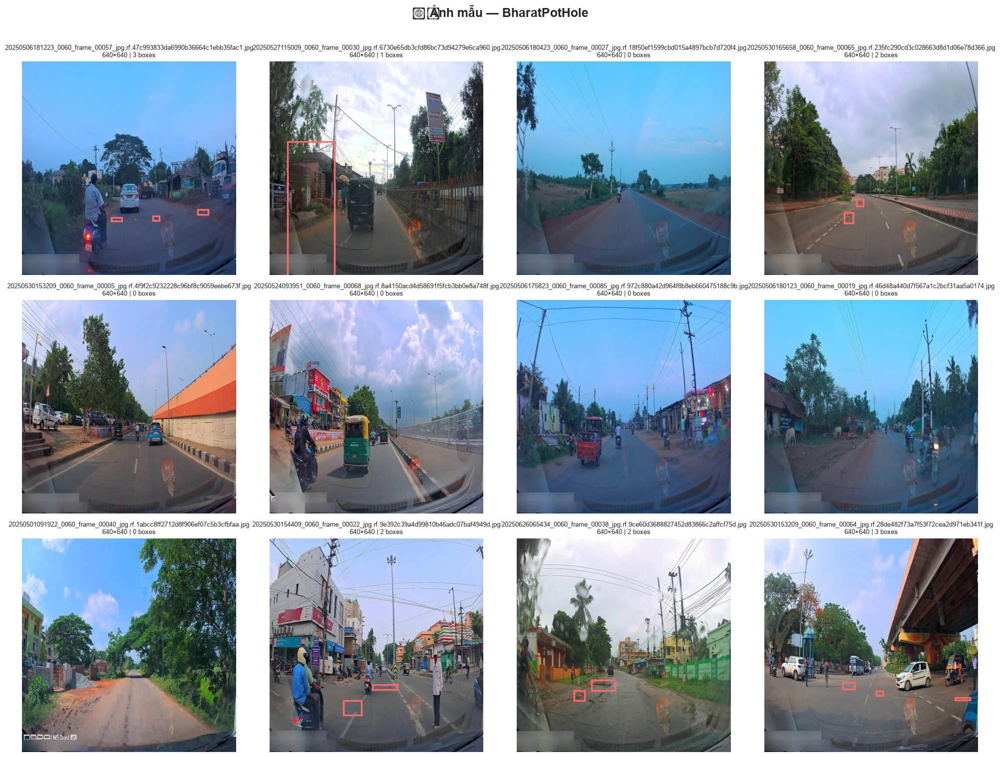

In [59]:
# ====================================================================
#  Hiển thị ảnh mẫu BharatPotHole
# ====================================================================

ensure_bharat_data()
if BHARAT_DIR.exists() and 'bharat_images' in dir() and len(bharat_images) > 0:
    n_show = min(12, len(bharat_images))
    sample_imgs_show = random.sample(bharat_images, n_show)
    
    n_cols = 4
    n_rows = (n_show + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))
    fig.suptitle('🕳️ Ảnh mẫu — BharatPotHole', fontsize=18, fontweight='bold', y=1.01)
    
    if n_rows == 1:
        axes = [axes]
    
    for idx, img_path in enumerate(sample_imgs_show):
        row = idx // n_cols
        col = idx % n_cols
        ax = axes[row][col]
        
        try:
            img = Image.open(img_path)
            ax.imshow(img)
            w, h = img.size
            # Kiểm tra xem có nhãn tương ứng không
            lbl_path = img_path.parent.parent / 'labels' / f"{img_path.stem}.txt"
            if not lbl_path.exists():
                lbl_path = img_path.with_suffix('.txt')
            
            if lbl_path.exists():
                boxes = parse_yolo_label(lbl_path)
                # Vẽ bounding boxes nếu có
                colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA07A', '#98D8C8']
                for box in boxes:
                    cls_id = box['class_id']
                    color = colors[cls_id % len(colors)]
                    x_center = box['x_center'] * w
                    y_center = box['y_center'] * h
                    bw = box['width'] * w
                    bh = box['height'] * h
                    x1 = x_center - bw / 2
                    y1 = y_center - bh / 2
                    rect = patches.Rectangle(
                        (x1, y1), bw, bh,
                        linewidth=2.5, edgecolor=color, facecolor='none'
                    )
                    ax.add_patch(rect)
                ax.set_title(f"{img_path.name}\n{w}×{h} | {len(boxes)} boxes", fontsize=9)
            else:
                # Lấy tên thư mục cha làm class nếu là classification
                parent_name = img_path.parent.name
                ax.set_title(f"{parent_name}/{img_path.name}\n{w}×{h}", fontsize=9)
        except Exception as e:
            ax.text(0.5, 0.5, f'Lỗi: {str(e)[:50]}',
                    ha='center', va='center', transform=ax.transAxes)
        
        ax.set_axis_off()
    
    # Ẩn axes thừa
    for idx in range(n_show, n_rows * n_cols):
        row = idx // n_cols
        col = idx % n_cols
        axes[row][col].set_axis_off()
    
    plt.tight_layout()
    plt.show()
else:
    print("⏭️ Bỏ qua — BharatPotHole chưa tải.")

---
## 6. 📊 So sánh tổng quan 2 Datasets

In [60]:
# ====================================================================
#  Bảng so sánh tổng hợp
# ====================================================================

ensure_rdd_stats()
ensure_bharat_data()
comparison_data = []

# RDD-2022
if RDD_DIR.exists() and 'rdd_stats' in dir():
    total_rdd_imgs = sum(v['n_images'] for v in rdd_stats.values())
    total_rdd_lbls = sum(v['n_labels'] for v in rdd_stats.values())
    rdd_row = {
        'Dataset': 'RDD-2022',
        'Tổng ảnh': total_rdd_imgs,
        'Tổng nhãn': total_rdd_lbls,
        'Số class': len(class_counter) if 'class_counter' in dir() else 'N/A',
        'Tổng BB': sum(class_counter.values()) if 'class_counter' in dir() else 'N/A',
        'Format nhãn': 'YOLO',
        'Kích thước (GB)': '~10',
    }
    if 'df_rdd_imgs' in dir() and len(df_rdd_imgs) > 0:
        rdd_row['Avg Width'] = int(df_rdd_imgs['width'].mean())
        rdd_row['Avg Height'] = int(df_rdd_imgs['height'].mean())
    comparison_data.append(rdd_row)
else:
    comparison_data.append({
        'Dataset': 'RDD-2022',
        'Tổng ảnh': '⚠️ Chưa tải',
        'Kích thước (GB)': '~10',
    })

# BharatPotHole
if BHARAT_DIR.exists() and 'bharat_images' in dir():
    bharat_row = {
        'Dataset': 'BharatPotHole',
        'Tổng ảnh': len(bharat_images),
        'Tổng nhãn': len(bharat_labels),
        'Số class': len(bharat_class_counter) if 'bharat_class_counter' in dir() else 'N/A',
        'Tổng BB': sum(bharat_class_counter.values()) if 'bharat_class_counter' in dir() else 'N/A',
        'Format nhãn': 'YOLO' if bharat_labels else 'Classification/Other',
        'Kích thước (GB)': '~0.76',
    }
    if 'df_bharat_imgs' in dir() and len(df_bharat_imgs) > 0:
        bharat_row['Avg Width'] = int(df_bharat_imgs['width'].mean())
        bharat_row['Avg Height'] = int(df_bharat_imgs['height'].mean())
    comparison_data.append(bharat_row)
else:
    comparison_data.append({
        'Dataset': 'BharatPotHole',
        'Tổng ảnh': '⚠️ Chưa tải',
        'Kích thước (GB)': '~0.76',
    })

df_comparison = pd.DataFrame(comparison_data)
print("\n" + "=" * 70)
print("📊 BẢNG SO SÁNH TỔNG HỢP 2 DATASETS")
print("=" * 70)
display(df_comparison.set_index('Dataset').T)


📊 BẢNG SO SÁNH TỔNG HỢP 2 DATASETS


Dataset,RDD-2022,BharatPotHole
Tổng ảnh,38385,7074
Tổng nhãn,38385,7076
Số class,5,1
Tổng BB,65712,12221
Format nhãn,YOLO,YOLO
Kích thước (GB),~10,~0.76
Avg Width,1286,640
Avg Height,915,640


C:\Users\Admin\AppData\Local\Temp\ipykernel_29052\4183834336.py:51: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from font(s) Arial.
  plt.tight_layout()
D:\Research\Yolo_Pothole_detection\Pothole_Detection\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


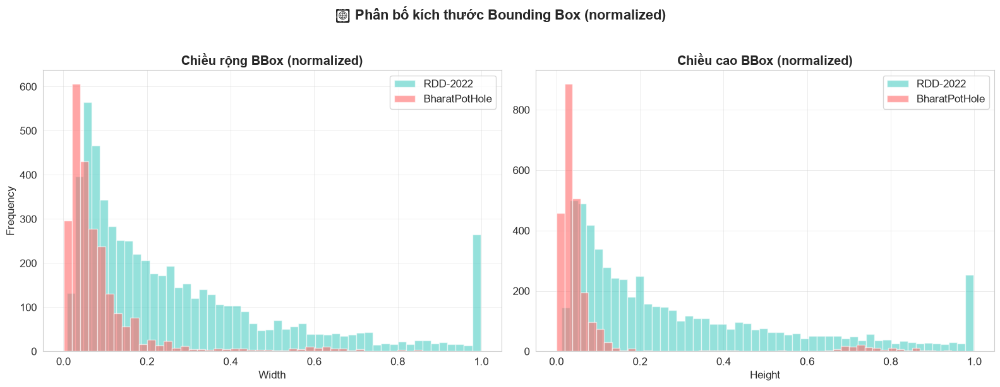

In [61]:
# ====================================================================
#  Phân bố kích thước bounding box (nếu cả 2 dataset đều có)
# ====================================================================

ensure_rdd_stats()
ensure_bharat_data()
has_rdd = RDD_DIR.exists() and 'rdd_stats' in dir()
has_bharat = BHARAT_DIR.exists() and 'bharat_labels' in dir() and len(bharat_labels) > 0

if has_rdd or has_bharat:
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle('📦 Phân bố kích thước Bounding Box (normalized)',
                 fontsize=16, fontweight='bold', y=1.02)
    
    if has_rdd:
        # Lấy mẫu box widths/heights từ RDD
        rdd_box_widths, rdd_box_heights = [], []
        all_rdd_labels_list = []
        for sd in rdd_stats.values():
            all_rdd_labels_list.extend(sd['labels'])
        
        for lbl in all_rdd_labels_list[:3000]:
            for box in parse_yolo_label(lbl):
                rdd_box_widths.append(box['width'])
                rdd_box_heights.append(box['height'])
        
        if rdd_box_widths:
            axes[0].hist(rdd_box_widths, bins=50, alpha=0.6, color='#4ECDC4', label='RDD-2022')
            axes[1].hist(rdd_box_heights, bins=50, alpha=0.6, color='#4ECDC4', label='RDD-2022')
    
    if has_bharat:
        bharat_box_widths, bharat_box_heights = [], []
        for lbl in bharat_labels[:3000]:
            for box in parse_yolo_label(lbl):
                bharat_box_widths.append(box['width'])
                bharat_box_heights.append(box['height'])
        
        if bharat_box_widths:
            axes[0].hist(bharat_box_widths, bins=50, alpha=0.6, color='#FF6B6B', label='BharatPotHole')
            axes[1].hist(bharat_box_heights, bins=50, alpha=0.6, color='#FF6B6B', label='BharatPotHole')
    
    axes[0].set_title('Chiều rộng BBox (normalized)', fontweight='bold')
    axes[0].set_xlabel('Width')
    axes[0].set_ylabel('Frequency')
    axes[0].legend()
    
    axes[1].set_title('Chiều cao BBox (normalized)', fontweight='bold')
    axes[1].set_xlabel('Height')
    axes[1].legend()
    
    plt.tight_layout()
    plt.show()
else:
    print("⏭️ Chưa có dataset nào được tải.")

---
## 7. 📝 Nhận xét & Kết luận sơ bộ

### Quan sát chính:

1. **RDD-2022:**
   - Dataset lớn (~10 GB, ~38K ảnh) với 5 classes hư hại đường bộ
   - Đã chia sẵn train/val/test (70/15/15)
   - Annotation YOLO format — sẵn sàng train
   - Đa quốc gia → đa dạng điều kiện đường sá

2. **BharatPotHole:**
   - Dataset nhỏ hơn (~765 MB)
   - Tập trung vào ổ gà (pothole) tại Ấn Độ
   - Phù hợp để bổ sung thêm dữ liệu cho class "Pothole"

### Bước tiếp theo:
- [ ] Xử lý, chuẩn hóa dữ liệu (resize, augmentation)
- [ ] Gộp 2 dataset thành 1 dataset thống nhất (nếu cần)
- [ ] Chia lại train/val/test (nếu cần)
- [ ] Train mô hình YOLO